In [12]:
from wrapper_functions import *

# Experiment II: 2D Spatial Field

### Model Configs

In [13]:
# Optimization configs. 
# Consider reduce below parameters / set to `False` if MCMC is taking too long:
# mcmc_num_steps, mcmc_burnin, mcmc_nchain, mcmc_initialize_from_map.
map_step_size=5e-4   # @param
map_num_steps=10_000  # @param

mcmc_step_size=1e-4 # @param
mcmc_num_steps=1000 # @param

mcmc_nchain=10 # @param
mcmc_burnin=2_500 # @param
bne_mcmc_initialize_from_map="True" # @param ["False", "True"]

bne_mcmc_initialize_from_map = eval(bne_mcmc_initialize_from_map)


In [14]:
# BMA parameters.
y_noise_std = 0.01  # Note: Changed from 0.1 # @param
bma_gp_lengthscale = .725 # @param
bma_gp_l2_regularizer = .05  # @param

bma_n_samples_train = 100 # @param
bma_n_samples_eval = 250 # @param
bma_n_samples_test = 250 # @param
bma_seed = 0 # @param


In [15]:
# BNE parameters.
bne_gp_lengthscale = 2.6 # 5. # @param
bne_gp_l2_regularizer = 4.95 # 15 # @param
bne_variance_prior_mean = -2.5 # @param
bne_skewness_prior_mean = -2.5 # @param
bne_seed = 0 # @param

### Read training/prediction data

In [16]:
training_eastMA = pd.read_csv('../data/training_dataset/training_eastMA.csv')
training_eastMA_noMI = training_eastMA[:51]
training_eastMA_folds = pd.read_csv('../data/training_dataset/training_eastMA_folds.csv')
base_model_predictions_eastMA = pd.read_csv('../data/prediction_dataset/base_model_predictions_eastMA.csv')
display(training_eastMA.shape, training_eastMA_folds.shape, base_model_predictions_eastMA.shape)
print("pred longitude max and min", base_model_predictions_eastMA["lon"].max(),base_model_predictions_eastMA["lon"].min())
print("pred latitude max and min", base_model_predictions_eastMA["lat"].max(),base_model_predictions_eastMA["lat"].min())
#list(base_model_predictions_eastMA.columns)
print("train longitude max and min", training_eastMA["lon"].max(),training_eastMA["lon"].min())
print("train latitude max and min", training_eastMA["lat"].max(),training_eastMA["lat"].min())


training51= pd.read_csv('../data/training_dataset/training51.csv')

(55, 7)

(55, 10)

(84421, 5)

pred longitude max and min -69.93 -73.5
pred latitude max and min 44.3 40.6
train longitude max and min -70.023598 -73.443056
train latitude max and min 44.107524 40.74529


In [17]:
# standardize
X_train1 = np.asarray(training_eastMA_noMI[["lon", "lat"]].values.tolist()).astype(np.float32)
X_test1 = np.asarray(base_model_predictions_eastMA[["lon", "lat"]].values.tolist()).astype(np.float32)
X_valid = np.concatenate((X_train1, X_test1), axis=0)
X_centr = np.mean(X_valid, axis=0)
X_scale = np.max(X_valid, axis=0) - np.min(X_valid, axis=0)

X_train1 = (X_train1 - X_centr) / X_scale
X_test1 = (X_test1 - X_centr) / X_scale

Y_train = np.expand_dims(training_eastMA_noMI["aqs"], 1).astype(np.float32)
#Y_test = np.expand_dims(base_model_predictions_eastMA["pred_av"], 1).astype(np.float32)

print("2011 center and scale: ", X_centr, X_scale)

2011 center and scale:  [-72.185104  42.680347] [3.5699997 3.7000008]


In [18]:
base_model_names = ["pred_av", "pred_gs", "pred_caces"]
base_preds_train = tf.stack([training_eastMA_noMI[base_model_name].astype(np.float32) for base_model_name in base_model_names], axis=-1)
base_preds_test = tf.stack([base_model_predictions_eastMA[base_model_name].astype(np.float32) for base_model_name in base_model_names], axis=-1)
#base_preds_test
display(base_preds_train.shape, base_preds_test.shape)

TensorShape([51, 3])

TensorShape([84421, 3])

## Bayesian Model Averaging

A Bayesian ensemble model where ensemble weights $w_k's$ are parameterized by Gaussian process priors:

$y \sim N(\mu(x), \sigma^2)$ 

$\mu(x) = \sum_{k=1}^K w_k(x) * m_k(x) \quad$  where $\{m_k\}_{k=1}^K$ are base model predictions.

$w(x) = softmax(f(x)) \qquad\;\;\;$ where $w=[w_1, \dots, w_K]$ and $f=[f_1, \dots, f_K]$

$f \stackrel{i.i.d.}{\sim} GaussianProcess(0, k)$




## Bayesian Additive Ensemble

Given $\mu(x)$ the posterior of a Bayesian ensemble model, the Bayesian Additive Ensemble is defined as:    

$y \sim N(\mu(x) + r(x), \sigma^2)$

$r \sim GaussianProcess(0, k)$

The additive ensemble $r(x)$ services two purposes: 

1. Mitigates systematic bias in model prediction; 
2. Quantifies the model's epistemic uncertainty.

**Prepare Data Dict**

In [19]:
data_dicts = dict(X_train = X_train1,
                  X_test=X_test1,
                  Y_train = Y_train,
                  base_preds_train = base_preds_train,
                  base_preds_test = base_preds_test)

In [20]:
bma_config=dict(gp_lengthscale=bma_gp_lengthscale,
                gp_l2_regularizer=bma_gp_l2_regularizer,
                y_noise_std=y_noise_std,
                map_step_size=map_step_size,
                map_num_steps=map_num_steps,
                mcmc_step_size=mcmc_step_size,
                mcmc_num_steps=mcmc_num_steps,
                mcmc_initialize_from_map=False,
                n_samples_eval=bma_n_samples_eval,
                n_samples_train=bma_n_samples_train,
                n_samples_test=bma_n_samples_test,
                seed=bma_seed)

bne_config = dict(gp_lengthscale=bne_gp_lengthscale,
                  gp_l2_regularizer=bne_gp_l2_regularizer,
                  variance_prior_mean=bne_variance_prior_mean,
                  skewness_prior_mean=bne_skewness_prior_mean,
                  map_step_size=map_step_size,
                  map_num_steps=map_num_steps,
                  mcmc_step_size=mcmc_step_size,
                  mcmc_num_steps=mcmc_num_steps,
                  mcmc_nchain=mcmc_nchain,
                  mcmc_burnin=mcmc_burnin,
                  mcmc_initialize_from_map=bne_mcmc_initialize_from_map,
                  seed=bne_seed)

In [21]:
def get_bne_result(data_dict, moment_mode, bne_config):
  """Trains Bayesian nonparametric ensemble."""
  mode_to_name_map = {'none': 'bma', 'mean': 'bae',
                      'variance': 'bne_var', 'skewness': 'bne_skew'}
  model_name = mode_to_name_map[moment_mode]

  joint_samples = run_bne_model(X_train=data_dict['X_train_mcmc'],
                                Y_train=data_dict['Y_train_mcmc'],
                                X_test=data_dict['X_test'],
                                base_model_samples_train=data_dict['means_train_mcmc'],
                                base_model_samples_test=data_dict['means_test_mcmc'],
                                moment_mode=moment_mode,
                                **bne_config)

  #data_dict[f'{model_name}_samples'] = joint_samples['y']
  #return data_dict
  return joint_samples

# @title Simulation: get_bma_result


def get_bma_result(data_dict, bma_config):
  """Trains Adaptive Bayesian model averaging."""
  (bma_joint_samples, X_train_mcmc, Y_train_mcmc,
   means_train_mcmc, means_test_mcmc) = run_bma_model(
       X_train=data_dict["X_train"],
       X_test=data_dict["X_test"],
       Y_train=data_dict["Y_train"],
       base_preds_train=data_dict["base_preds_train"],
       base_preds_test=data_dict["base_preds_test"],
       return_mcmc_examples=True,
       **bma_config)

  data_dict['X_train_mcmc'] = X_train_mcmc
  data_dict['Y_train_mcmc'] = Y_train_mcmc
  data_dict['means_train_mcmc'] = means_train_mcmc
  data_dict['means_test_mcmc'] = means_test_mcmc
  data_dict['bma_mean_samples'] = bma_joint_samples['y']
  # data_dict['bma_mean_samples_original'] = bma_joint_samples['mean_original']
  # data_dict['bma_mean_samples_resid'] = bma_joint_samples['resid']
  # data_dict['bma_weight_samples'] = bma_joint_samples['weights']

  return data_dict, bma_joint_samples

bma_config


{'gp_lengthscale': 0.725,
 'gp_l2_regularizer': 0.05,
 'y_noise_std': 0.01,
 'map_step_size': 0.0005,
 'map_num_steps': 10000,
 'mcmc_step_size': 0.0001,
 'mcmc_num_steps': 1000,
 'mcmc_initialize_from_map': False,
 'n_samples_eval': 250,
 'n_samples_train': 100,
 'n_samples_test': 250,
 'seed': 0}

In [22]:
# BMA-mean.
print('BMA-mean:', flush=True)

data_dict, bma_mean_joint_samples = get_bma_result(data_dicts, bma_config=bma_config)

# BMA.
bma_var_config = bne_config.copy()
bma_var_config['mcmc_initialize_from_map'] = bma_config['mcmc_initialize_from_map']

bma_joint_samples = get_bne_result(data_dict, moment_mode='none',
                                      bne_config=bma_var_config)

BMA-mean:
activation function used softmax
Running MCMC:	Acceptance Ratio: 0.14127370715141296
activation function used softmax
activation function used softmax
activation function used softmax
Running MCMC:	Acceptance Ratio: 0.7784168720245361


In [23]:
surface_pred_bma = np.mean(np.nan_to_num(data_dict['bma_mean_samples']), axis=0) 
surface_var_bma = np.var(np.nan_to_num(data_dict['bma_mean_samples']), axis=0)

In [24]:
print(bma_joint_samples.keys())
print(bma_mean_joint_samples.keys())
bma_var_config

dict_keys(['gp_weights', 'gps', 'scale', 'mean', 'y', 'mean_original', 'resid'])
dict_keys(['gp_weights', 'gps', 'ensemble_weights', 'y'])


{'gp_lengthscale': 2.6,
 'gp_l2_regularizer': 4.95,
 'variance_prior_mean': -2.5,
 'skewness_prior_mean': -2.5,
 'map_step_size': 0.0005,
 'map_num_steps': 10000,
 'mcmc_step_size': 0.0001,
 'mcmc_num_steps': 1000,
 'mcmc_nchain': 10,
 'mcmc_burnin': 2500,
 'mcmc_initialize_from_map': False,
 'seed': 0}

In [25]:
# BAE.
bae_joint_samples = get_bne_result(data_dict, moment_mode='mean',
                                      bne_config=bne_config)

Running MAP:	252281.796875...103972.953125...55633.9765625...33171.82421875...21286.4375...14615.33984375...10817.5703125...8705.564453125...7605.95361328125...7102.232421875...Done.
Running MCMC:	Acceptance Ratio: 0.6392030119895935


In [26]:
bae_joint_samples.keys()

dict_keys(['gp_weights', 'gps', 'scale', 'mean', 'y', 'mean_original', 'resid'])

In [27]:
surface_pred_bae = {k: np.mean(np.nan_to_num(bae_joint_samples[k]), axis=0) for k in ('y', 'mean_original', 'resid')}
surface_var_bae = {k: np.var(np.nan_to_num(bae_joint_samples[k]), axis=0) for k in ('y', 'mean_original', 'resid')}

## Bayesian Nonparametric Ensemble (Variance Only)
So far, we are only estimating the mean-component of the model, i.e., we are assuming: 

$y \sim Gaussian(m(x), \sigma^2); \quad m(x) = GP(0, k)$.

By doing so, the model is implicitly assuming the distribution of $y$ is always a symmetric Gaussian distribution with constant mean across space and time. As a result, our model can only quantify model uncertainty (due to lack of data) via the GP prior, but cannot flexibly capture the data uncertainty that is inherent to the empirical distribution of y.

To resolve this, we extend the ensemble's outcome distribution $y | f$ by also estimating the higher moments of the data distribution (e.g., variance, skewness, etc) using flexible estimators. Specifically, we specify the outcome distribution family to the [maximum-entropy distribution](https://en.wikipedia.org/wiki/Principle_of_maximum_entropy) given the known moments, so the predictive distribution is [minimax](https://arxiv.org/pdf/math/0410076.pdf) and still statistically efficient to estimate.

For example, when we want to estimate the first two moments (mean and variance) of the distribution, this leads to a Gaussian distribution with spatio-temporally adaptive variance $\sigma(x)^2$:

$$y \sim Gaussian(m(x), \sigma(x)^2); \quad \mbox{where} \quad m \sim GP(0, k_m), \sigma \sim GP(0, k_\sigma)$$

and when we want to estimate the first three moments (mean and variance) of the distribution, this leads to a [Exponentially-modifed Gaussian](https://en.wikipedia.org/wiki/Exponentially_modified_Gaussian_distribution) (EMG) distribution with spatio-temporally adaptive variance $\sigma(x)^2$ and skewness $\lambda(x)$:

$$y \sim EMG(m(x), \sigma(x)^2, \lambda(x)); \quad \mbox{where} \quad m \sim GP(0, k_m), \sigma \sim GP(0, k_\sigma), \lambda \sim GP(0, k_\lambda)$$




In [28]:
# BNE-Variance.
bne_vo_joint_samples =get_bne_result(data_dict, moment_mode='variance',
                                      bne_config=bne_config)

Running MAP:	289743.875...11361.80859375...7375.4140625...6950.10302734375...6889.52783203125...6847.0732421875...6797.71337890625...6747.341796875...6704.6044921875...6674.638671875...Done.
Running MCMC:	Acceptance Ratio: 0.697471022605896


In [29]:
surface_pred_bne_vo = {k: np.mean(np.nan_to_num(bne_vo_joint_samples[k]), axis=0) for k in ('y', 'mean_original', 'resid')}
surface_var_bne_vo = {k: np.var(np.nan_to_num(bne_vo_joint_samples[k]), axis=0) for k in ('y', 'mean_original', 'resid')}



## Bayesian Nonparametric Ensemble (Variance + Skewness)

In [30]:
# BNE-Skewness.
bne_vs_joint_samples = get_bne_result(data_dict, moment_mode='skewness',
                                      bne_config=bne_config)

Running MAP:	254507.1875...9706.1416015625...7744.88525390625...7175.62744140625...6964.9384765625...6893.3837890625...6853.0712890625...6817.17138671875...6785.54833984375...6760.3583984375...Done.
Running MCMC:	Acceptance Ratio: 0.6573448181152344


In [31]:
surface_pred_bne_vs = {k: np.mean(np.nan_to_num(bne_vs_joint_samples[k]), axis=0) for k in ('y', 'mean_original', 'resid')}
surface_var_bne_vs = {k: np.var(np.nan_to_num(bne_vs_joint_samples[k]), axis=0) for k in ('y', 'mean_original', 'resid')}

## Basic Plots

In [32]:
#_DATA_ADDR_PREFIX = "./example/data"
# Tuning Parameters
BMA_lenthscale = bma_gp_lengthscale
BNE_lenthscale = bne_gp_lengthscale
BMA_L2 = bma_gp_l2_regularizer
BNE_L2 = bne_gp_l2_regularizer
_SAVE_ADDR_PREFIX = "./pic/BMA_lenthscale_{}_L2_{}_BNE_lenthscale_{}_L2_{}".format(BMA_lenthscale, BMA_L2, BNE_lenthscale, BNE_L2)

path=_SAVE_ADDR_PREFIX
isExists=os.path.exists(path) #判断路径是否存在，存在则返回true

if not isExists:
    os.makedirs(path)


### 1. The predictive surface of individual base models.

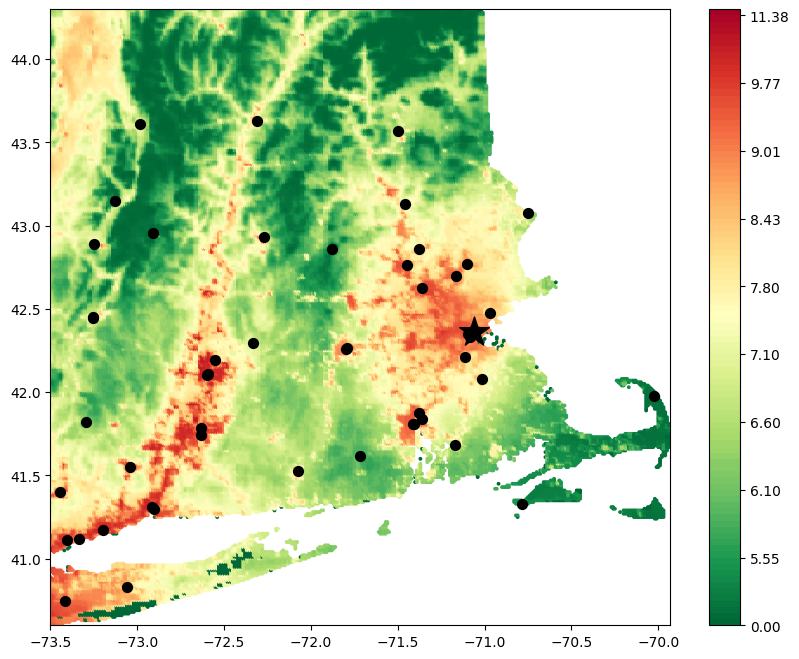

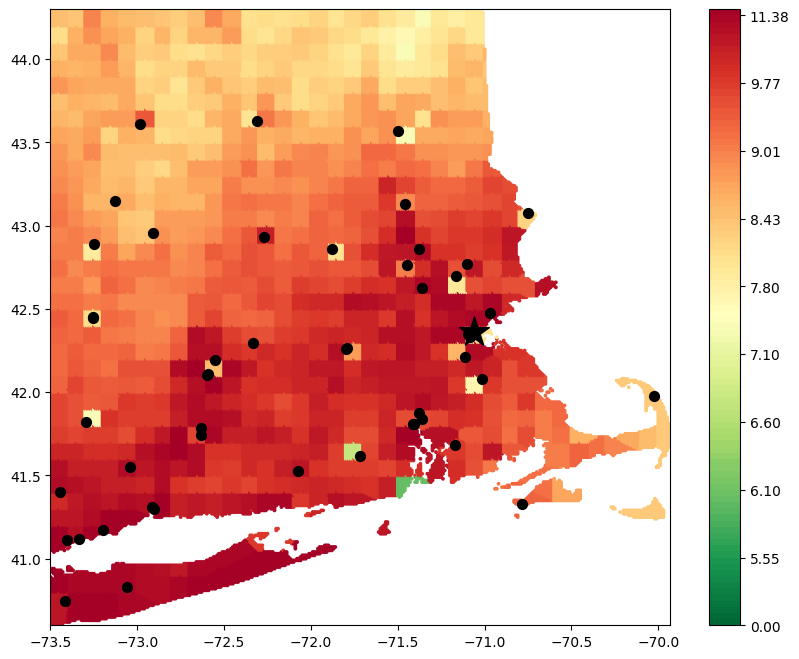

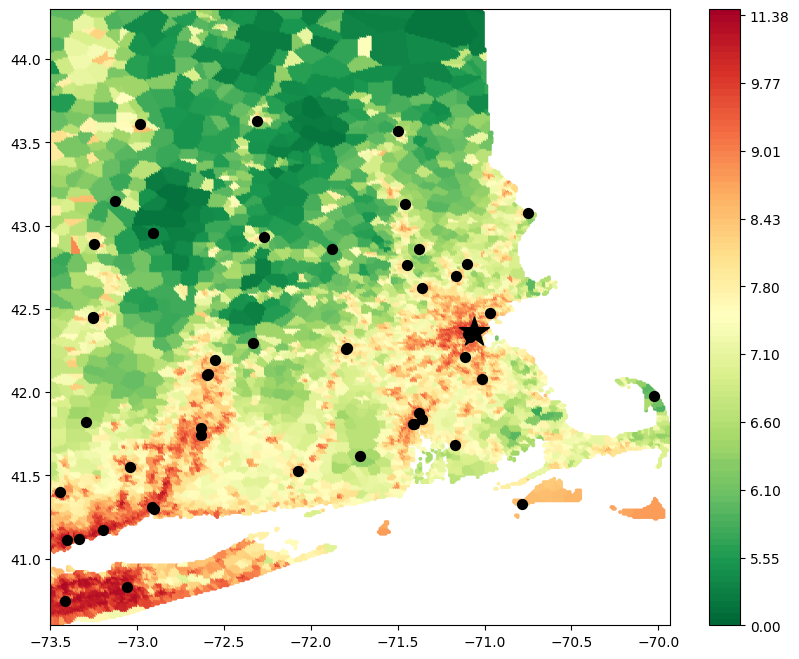

In [33]:
coordinate = np.asarray(base_model_predictions_eastMA[["lon", "lat"]].values.tolist()).astype(np.float32)
monitors = np.asarray(training_eastMA_noMI[["lon", "lat"]].values.tolist()).astype(np.float32)
base_model_names = ["pred_av", "pred_gs", "pred_caces"]

base_model_predictions_eastMA[["pred_av", "pred_gs", "pred_caces"]] = np.where(np.isnan(base_model_predictions_eastMA[["pred_av", "pred_gs", "pred_caces"]]), 0, base_model_predictions_eastMA[["pred_av", "pred_gs", "pred_caces"]])
color_norm_base = make_color_norm(
    base_model_predictions_eastMA[["pred_av", "pred_gs", "pred_caces"]],   
    method="percentile")

for base_model_name in base_model_names:
    save_name = os.path.join(_SAVE_ADDR_PREFIX,
                             'base_model_{}_bmals_{}_r_{}_bnels_{}_r_{}.png'.format(
                                 base_model_name, bma_gp_lengthscale,  bma_gp_l2_regularizer,
                                 bne_gp_lengthscale, bne_gp_l2_regularizer))
    
    posterior_heatmap_2d(base_model_predictions_eastMA[base_model_name], coordinate,
                         monitors,
                         cmap='RdYlGn_r',
                         norm=color_norm_base, 
                         #norm_method="percentile",
                         save_addr='')
    

### 2. The predictive surface of individual BNE gp weights

In [ ]:
bma_ensemble_weights = bma_mean_joint_samples['ensemble_weights']
ensemble_weights_val = tf.reduce_mean(bma_ensemble_weights, axis=0)

weights_dict = {
    "AV": ensemble_weights_val[:, 0],
    "GS": ensemble_weights_val[:,1],
    "CACES": ensemble_weights_val[:,2],
}
#weights_dict
color_norm_weights = make_color_norm(
    list(weights_dict.values()),#[2],   
    method="percentile")

In [35]:
ensemble_weights_var = np.var(bma_ensemble_weights, axis=0)
weights_var_dict = {
    "AV": ensemble_weights_var[:, 0],
    "GS": ensemble_weights_var[:,1],
    "CACES": ensemble_weights_var[:,2],
}
#weights_dict
color_norm_weights_var = make_color_norm(
    list(weights_var_dict.values()),#[0],   
    method="percentile")
# display(ensemble_weights_val,ensemble_weights_var)

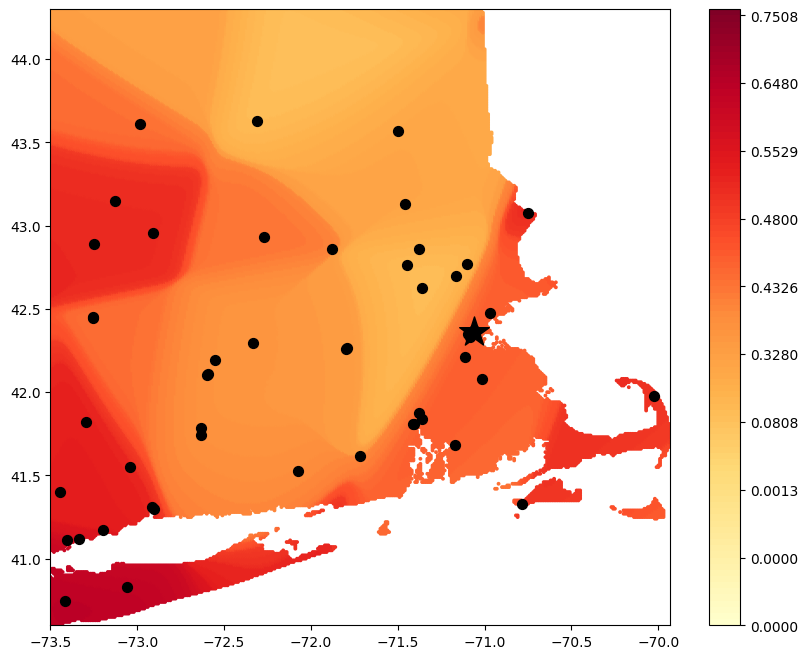

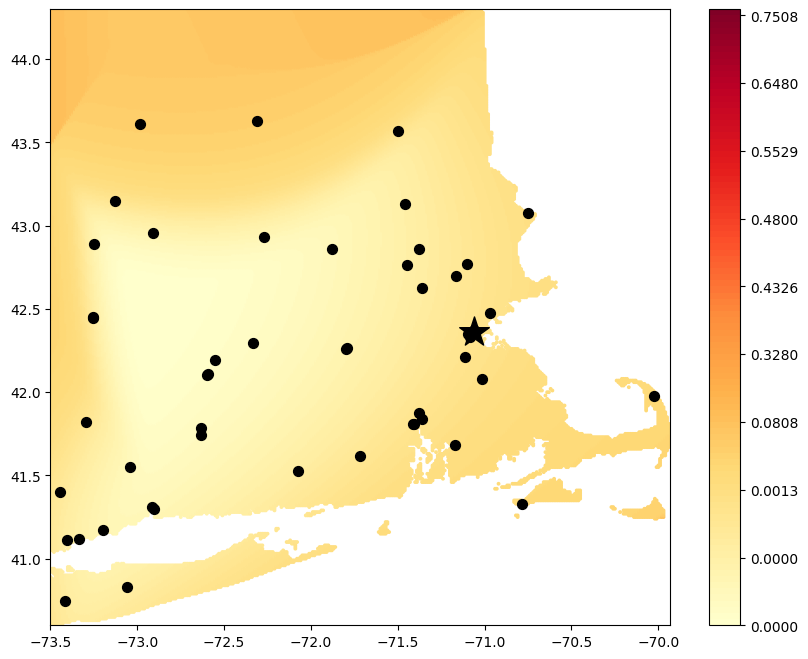

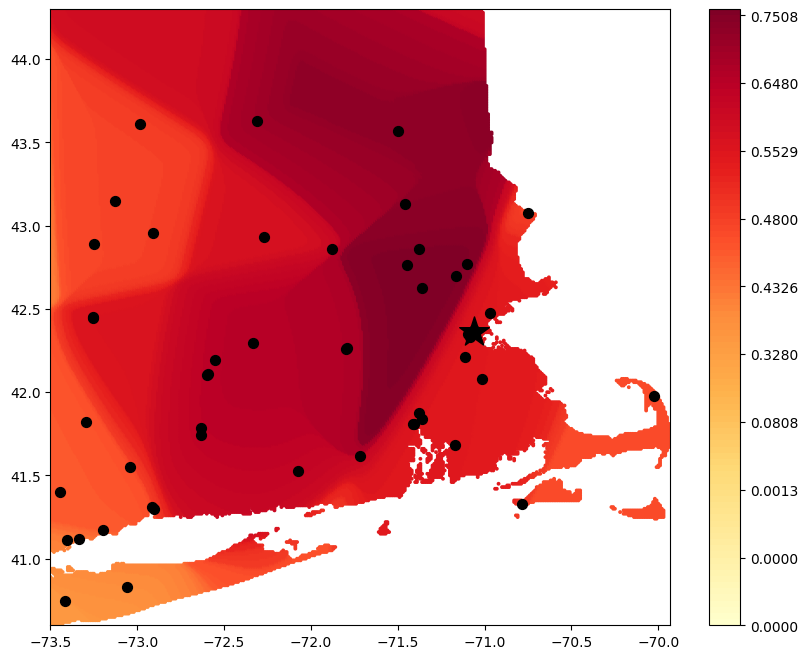

In [36]:
base_model_names = ["AV", "GS", "CACES"]
for base_model_name in base_model_names:
    save_name = os.path.join(_SAVE_ADDR_PREFIX,
                             'base_weights_{}_bmals_{}_r_{}_bnels_{}_r_{}.png'.format(
                                 base_model_name, bma_gp_lengthscale,  bma_gp_l2_regularizer,
                                 bne_gp_lengthscale, bne_gp_l2_regularizer))
    
    posterior_heatmap_2d(weights_dict[base_model_name], coordinate,
                         monitors,
                         cmap='YlOrRd',
                         norm=color_norm_weights, 
                         #norm_method="percentile",
                         save_addr='')
                         #save_addr=save_name)

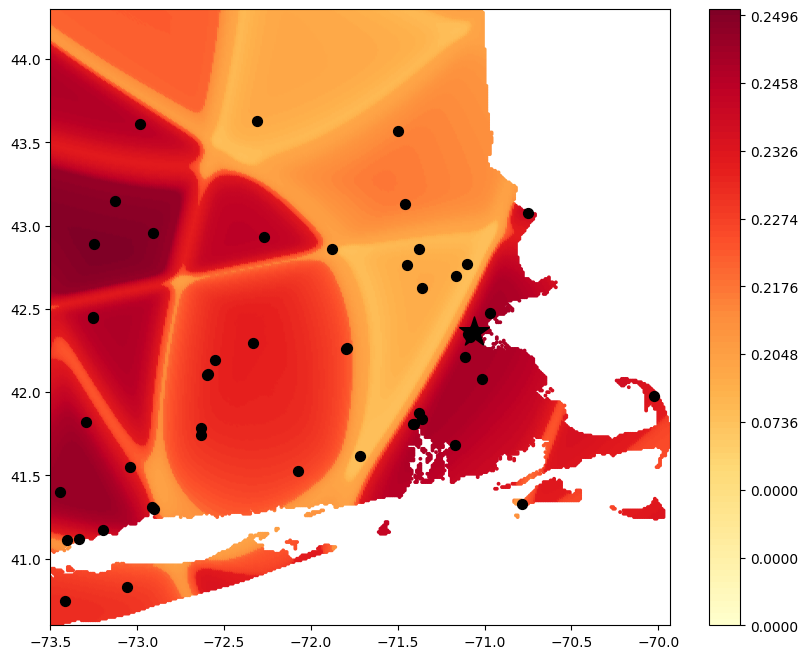

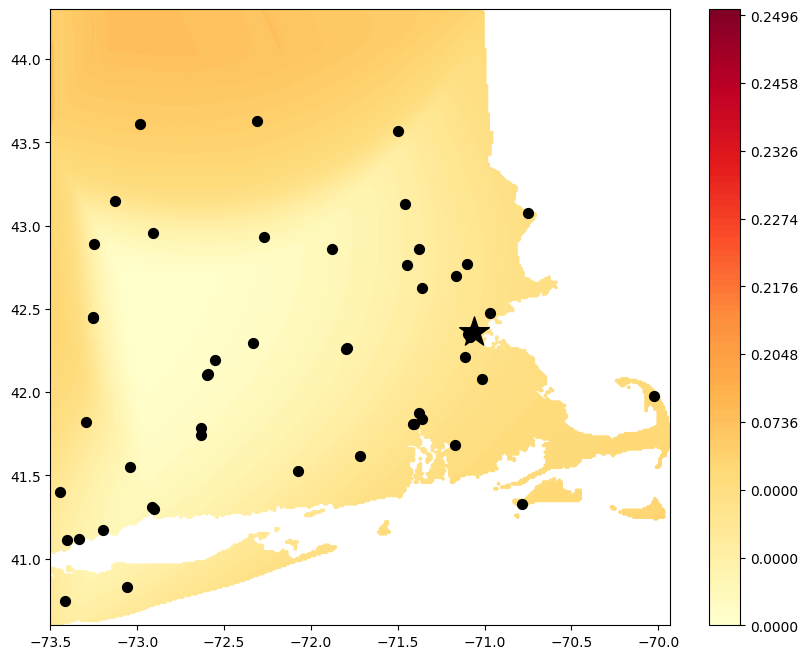

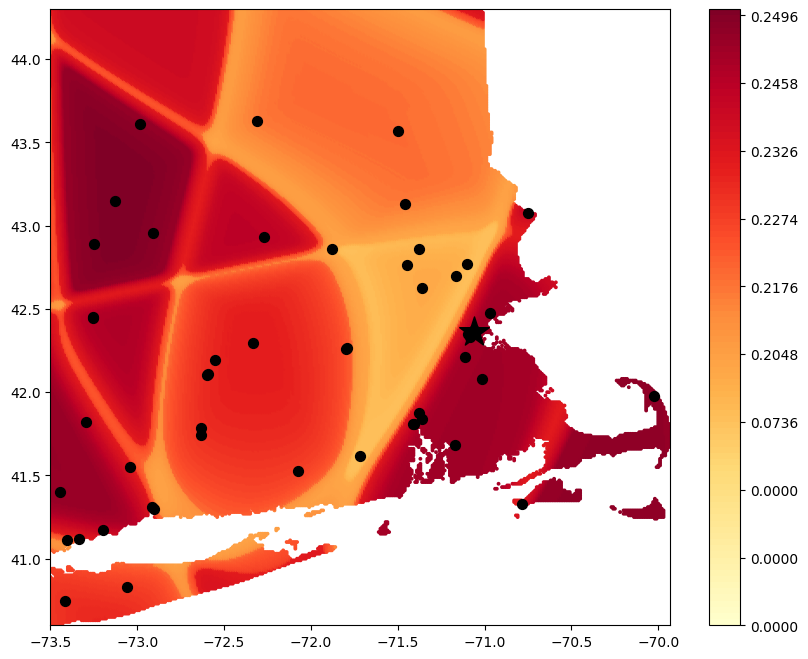

In [37]:
# plot weights' variance
for base_model_name in base_model_names:
    save_name = os.path.join(_SAVE_ADDR_PREFIX,
                             'base_wvar_{}_bmals_{}_r_{}_bnels_{}_r_{}.png'.format(
                                 base_model_name, bma_gp_lengthscale,  bma_gp_l2_regularizer,
                                 bne_gp_lengthscale, bne_gp_l2_regularizer))
    
    posterior_heatmap_2d(weights_var_dict[base_model_name], coordinate,
                         monitors,
                         cmap='YlOrRd',
                         norm=color_norm_weights_var, 
                         #norm_method="percentile",
                         save_addr='')
                         #save_addr=save_name)

#### 2.3 Base Models’ Weights’ un-transformed gp's

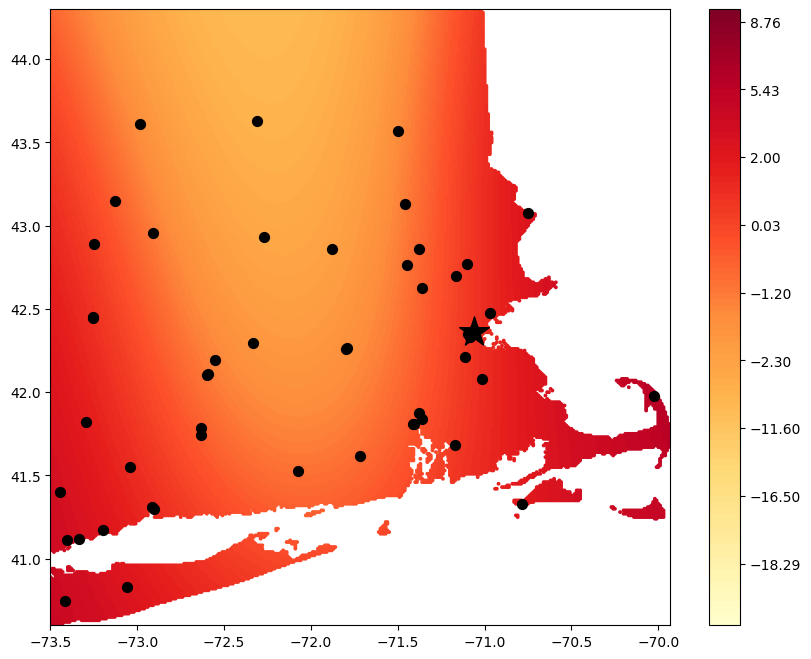

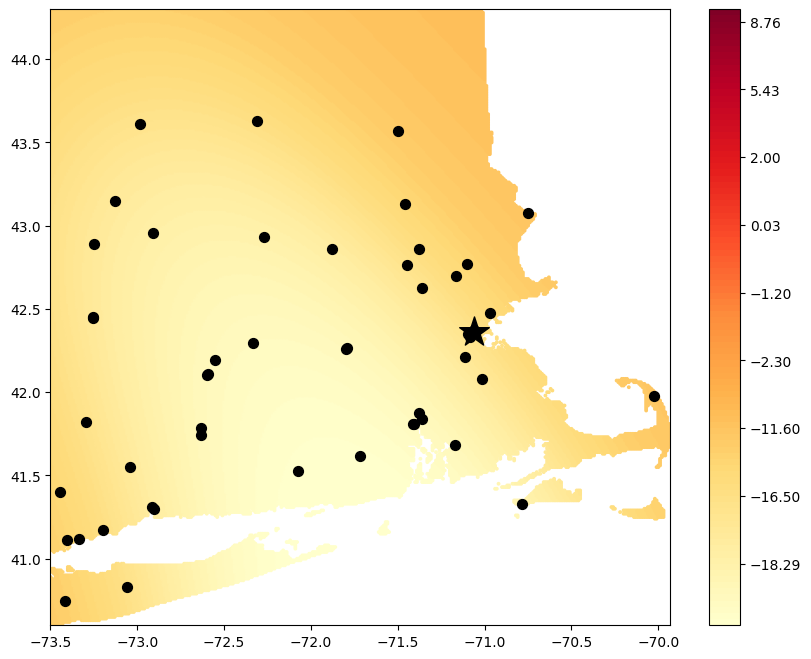

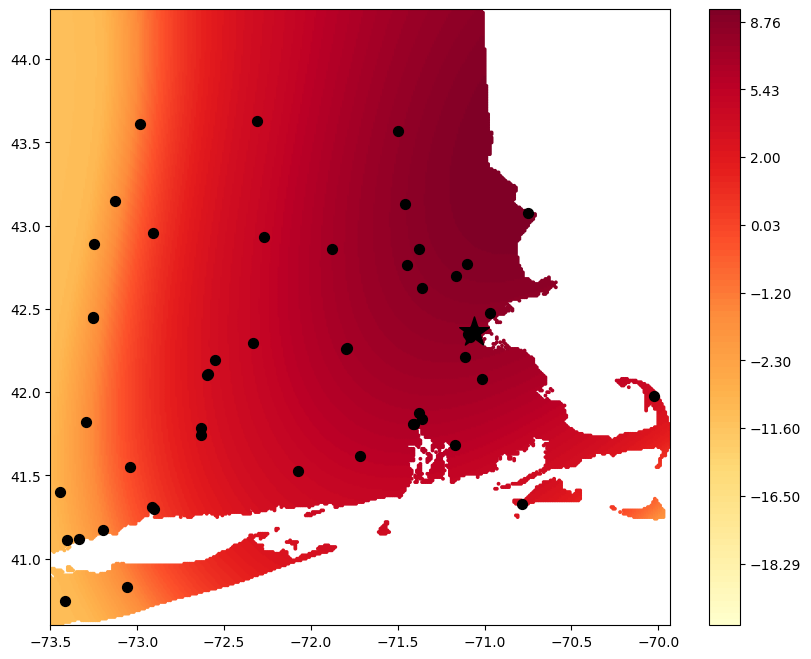

In [38]:
bma_ensemble_weights_gps = bma_mean_joint_samples['gps']
gp_weights_val = tf.reduce_mean(bma_ensemble_weights_gps, axis=0)
gp_dict = {
    "AV": gp_weights_val[:, 0],
    "GS": gp_weights_val[:,1],
    "CACES": gp_weights_val[:,2],
}

gp_color_norm_weights = make_color_norm(
    list(gp_dict.values()),#[2],   
    method="percentile")

gp_weights_var = np.var(bma_ensemble_weights_gps, axis=0)
gp_weights_var_dict = {
    "AV": gp_weights_var[:, 0],
    "GS": gp_weights_var[:,1],
    "CACES": gp_weights_var[:,2],
}

gp_color_norm_weights_var = make_color_norm(
    list(gp_weights_var_dict.values()),#[0],   
    method="percentile")


for base_model_name in base_model_names:
    save_name = os.path.join(_SAVE_ADDR_PREFIX,
                             'base_untrans_gps_weights_{}_bmals_{}_r_{}_bnels_{}_r_{}.png'.format(
                                 base_model_name, bma_gp_lengthscale,  bma_gp_l2_regularizer,
                                 bne_gp_lengthscale, bne_gp_l2_regularizer))
    
    posterior_heatmap_2d(gp_dict[base_model_name], coordinate,
                         monitors,
                         cmap='YlOrRd',
                         norm=gp_color_norm_weights, 
                         #norm_method="percentile",
                         save_addr='')
                         #save_addr=save_name)

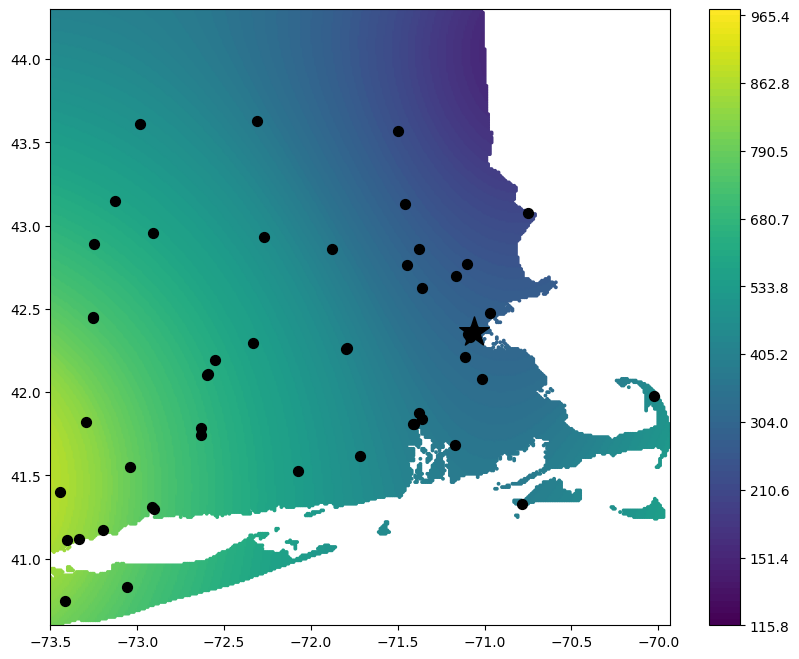

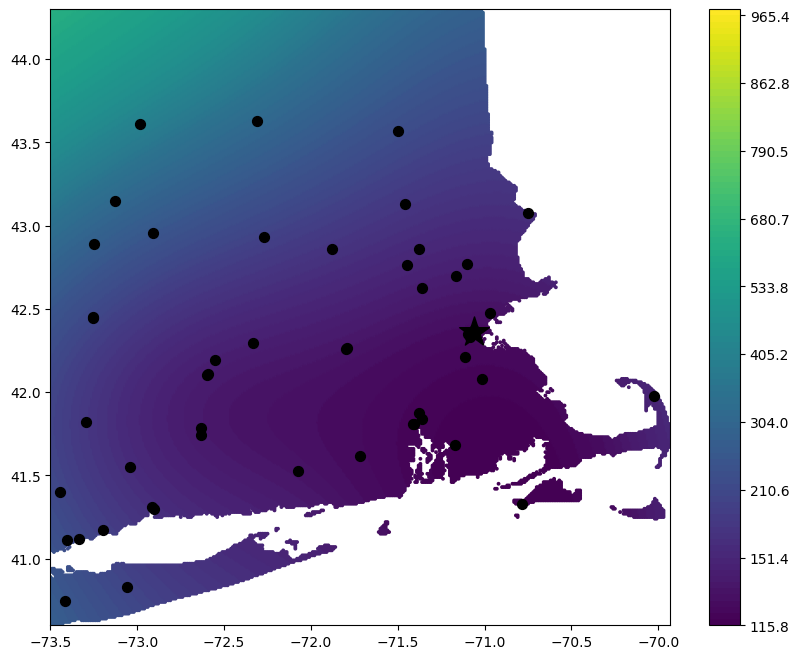

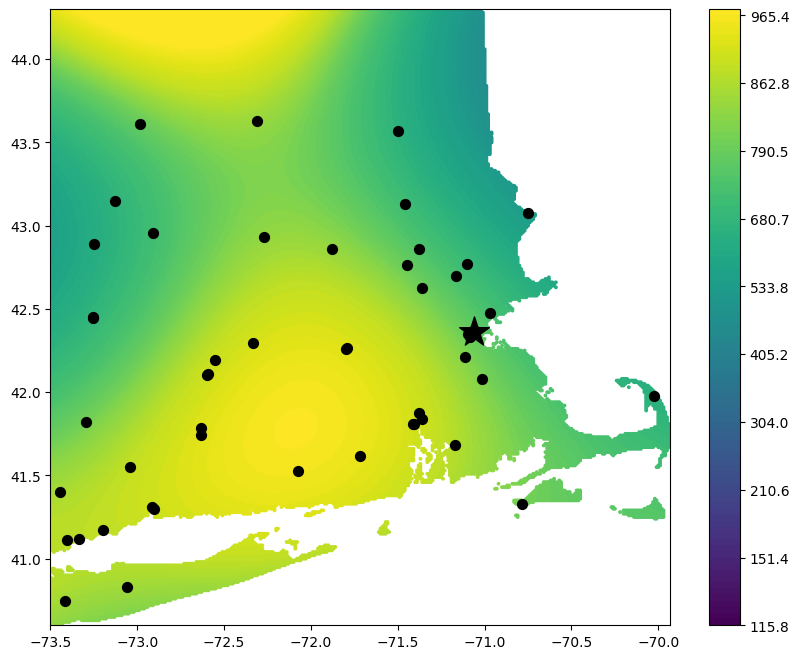

In [39]:
for base_model_name in base_model_names:
    save_name = os.path.join(_SAVE_ADDR_PREFIX,
                             'base_untrans_gps_weights_{}_bmals_{}_r_{}_bnels_{}_r_{}.png'.format(
                                 base_model_name, bma_gp_lengthscale,  bma_gp_l2_regularizer,
                                 bne_gp_lengthscale, bne_gp_l2_regularizer))
    
    posterior_heatmap_2d(gp_weights_var_dict[base_model_name], coordinate,
                         monitors,
                         cmap='viridis',
                         norm=gp_color_norm_weights_var, 
                         #norm_method="percentile",
                         save_addr='')
                         #save_addr=save_name)

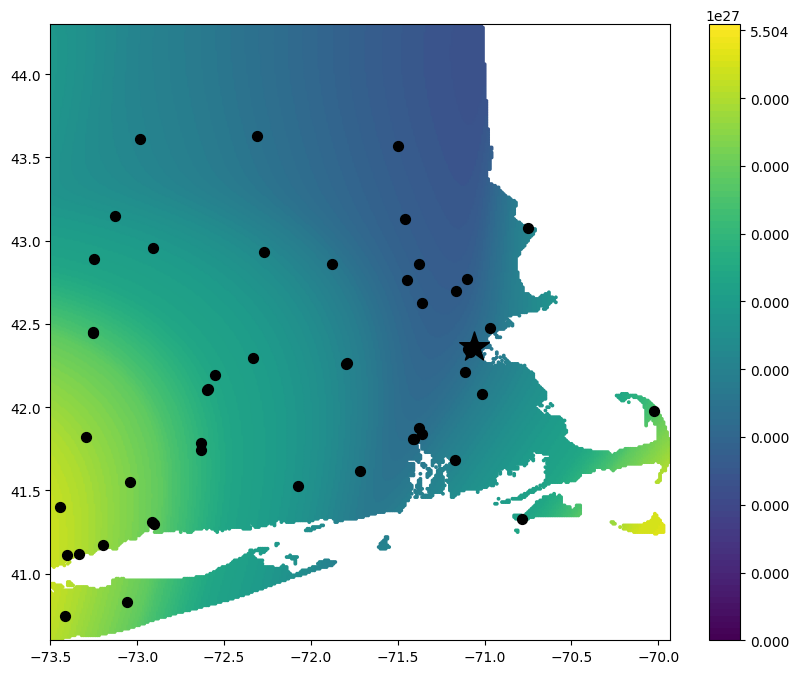

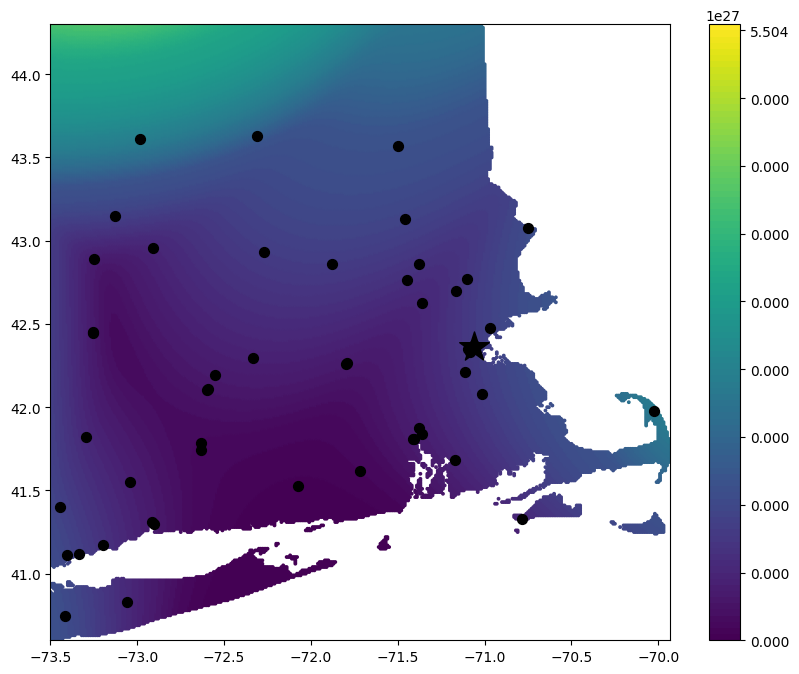

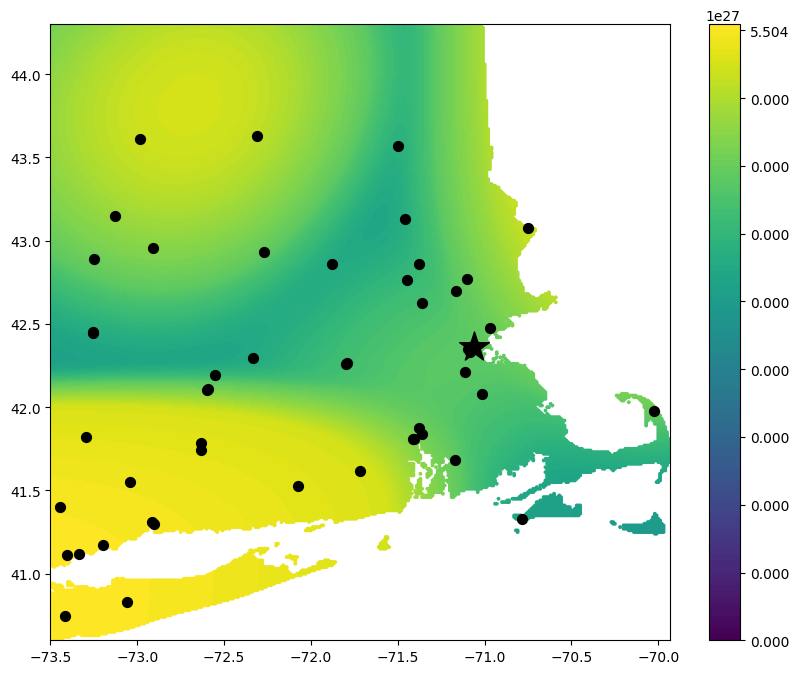

In [40]:
numerators = tf.math.exp(bma_mean_joint_samples['gps'])

numerators_val = tf.reduce_mean(numerators, axis=0)

weights_dict = {
    "AV": numerators_val[:, 0],
    "GS": numerators_val[:,1],
    "CACES": numerators_val[:,2],
}
#weights_dict
color_norm_weights = make_color_norm(
    list(weights_dict.values()),
    method="percentile")

base_model_names = ["AV", "GS", "CACES"]

for base_model_name in base_model_names:
    save_name = os.path.join(_SAVE_ADDR_PREFIX,
                             'base_untrans_gps_weights_{}_bmals_{}_r_{}_bnels_{}_r_{}.png'.format(
                                 base_model_name, bma_gp_lengthscale,  bma_gp_l2_regularizer,
                                 bne_gp_lengthscale, bne_gp_l2_regularizer))
    
    posterior_heatmap_2d(weights_dict[base_model_name], coordinate,
                         monitors,
                         cmap='viridis',
                         norm=color_norm_weights, 
                         #norm_method="percentile",
                         save_addr='')
                         #save_addr=save_name)


In [41]:
denominators = tf.math.reduce_sum(tf.math.exp(bma_mean_joint_samples['gps']), axis=2)
denominators = tf.reduce_mean(denominators, axis=0)
denominators
color_norm_weights = make_color_norm(
    list(denominators),
    method="percentile")
posterior_heatmap_2d(denominators, coordinate,
                         monitors,
                         cmap='viridis',
                         norm=color_norm_weights, 
                         #norm_method="percentile",
                         save_addr='')
                         #save_addr=save_name)



ValueError: zero-dimensional arrays cannot be concatenated

In [ ]:
# save the tf.Tensor: shape=(84421,)  in list
weights_dict_list = denominators.numpy().tolist()


AttributeError: EagerTensor object has no attribute 'T'. 
        If you are looking for numpy-related methods, please run the following:
        from tensorflow.python.ops.numpy_ops import np_config
        np_config.enable_numpy_behavior()
      

### 3. The predictive & variance surface of BMA

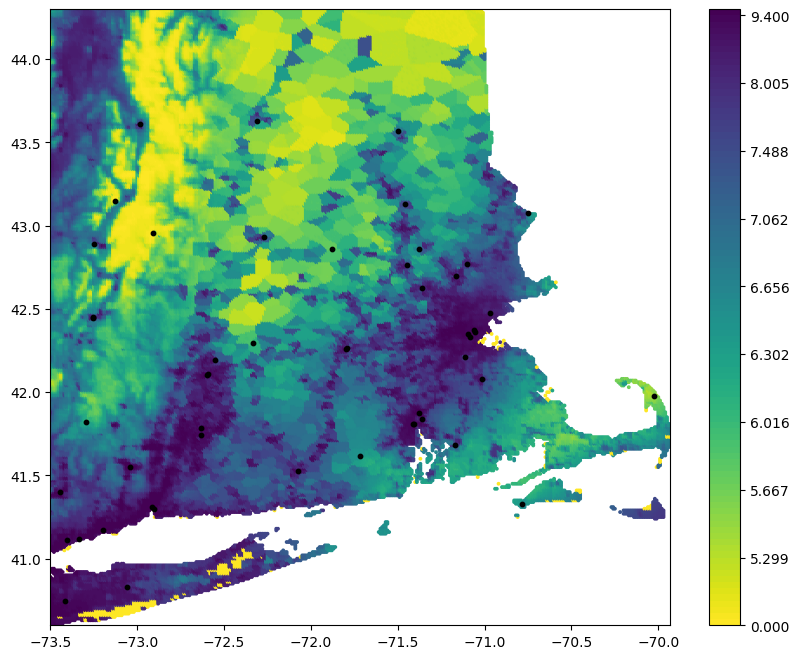

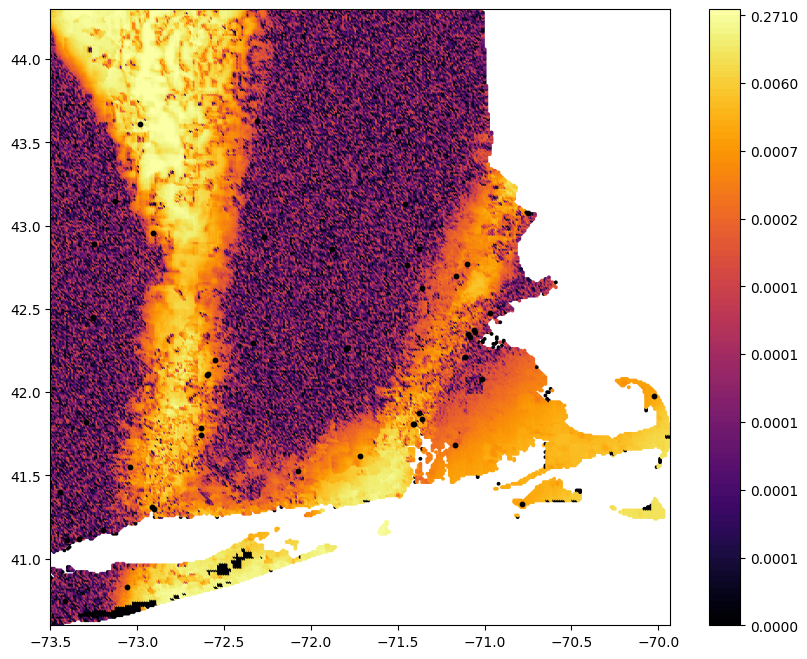

In [ ]:
# BMA

color_norm_pred = make_color_norm(
    list(surface_pred_bma), 
    method="percentile")

color_norm_var = make_color_norm(
    list(surface_var_bma), 
    method="percentile")

color_norm_var_r = make_color_norm(
    list(surface_var_bma), 
    method="percentile")

color_norm = posterior_heatmap_2d(surface_pred_bma, X=coordinate, X_monitor=monitors,
                                cmap='viridis_r',
                                norm= color_norm_pred,
                                #norm_method="percentile",
                                      save_addr='')
# for value in surface_var_bma:
# #     save_name = os.path.join(_SAVE_ADDR_PREFIX,
# #                             'var_BAE_{}_bma:ls_{}_r_{}_bne:ls_{}_r_{}.png'.format(
# #                                 name, bma_gp_lengthscale,  bma_gp_l2_regularizer,
# #                                 bne_gp_lengthscale, bne_gp_l2_regularizer))
#     #value = np.where(np.isnan(value), 0, value)
color_norm = posterior_heatmap_2d(surface_var_bma, X=coordinate, X_monitor=monitors,
                                cmap='inferno',
                                norm= color_norm_var_r,
                                #norm_method="percentile",
                                      save_addr='')
                                #save_addr=save_name)

### 4. The predictive surface of Y_mean, residual process, and Y_mean + residual process.

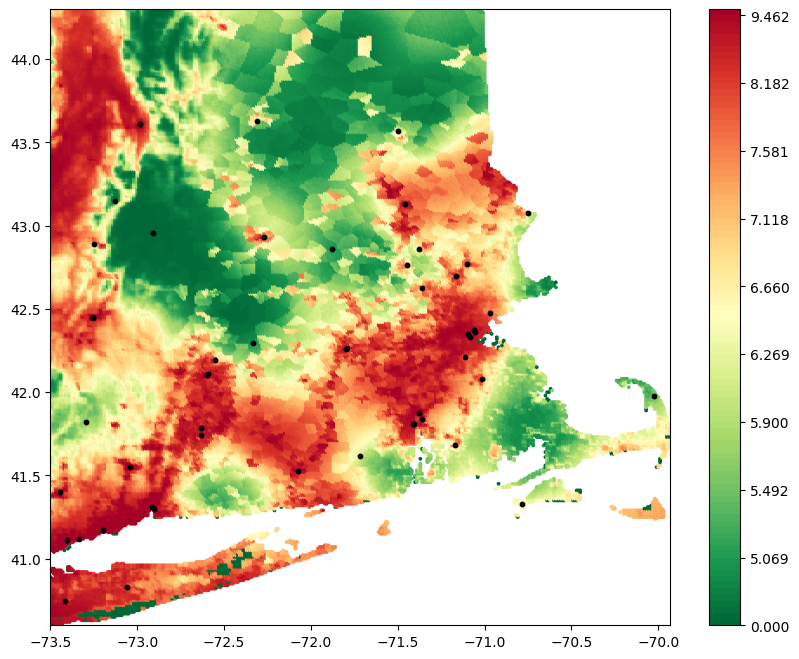

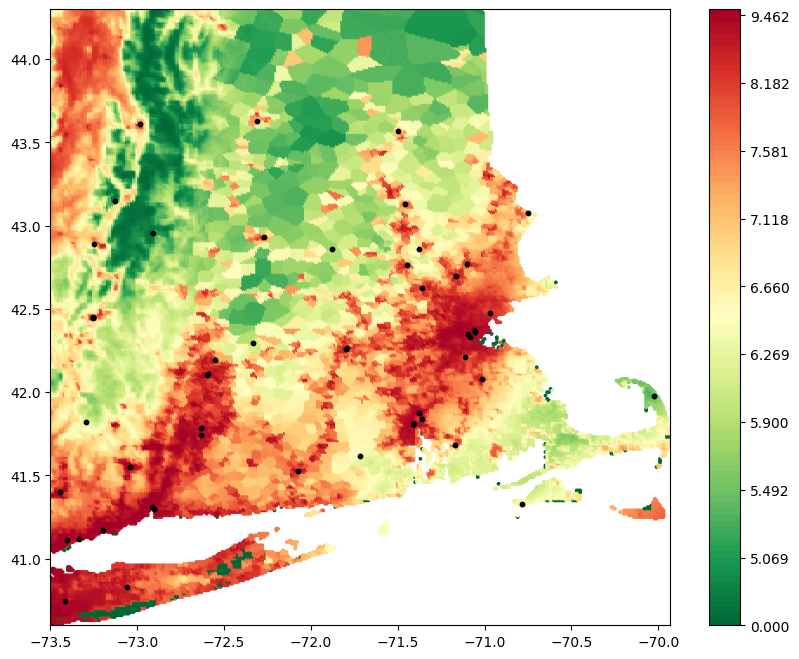

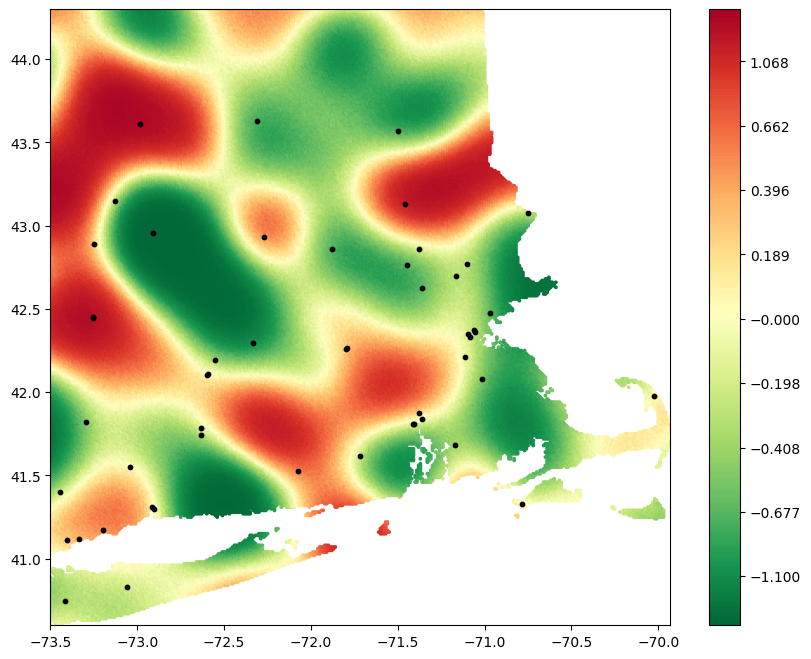

In [ ]:
# BAE
color_norm_pred = make_color_norm(
    #np.nan_to_num(list(surface_pred_bae.values())[:2][0]),
    list(surface_pred_bae.values())[:2],  
    method="percentile")

color_norm_pred_r = make_color_norm(
    #np.nan_to_num(list(surface_pred_bae.values())[2:]),
    list(surface_pred_bae.values())[2],  
    method="residual_percentile")


for name, value in surface_pred_bae.items():
    save_name = os.path.join(_SAVE_ADDR_PREFIX,
                            'BAE_{}_bma:ls_{}_r_{}_bne:ls_{}_r_{}.png'.format(
                                name, bma_gp_lengthscale,  bma_gp_l2_regularizer,
                                bne_gp_lengthscale, bne_gp_l2_regularizer))

    value = np.where(np.isnan(value), 0, value)
    color_norm = posterior_heatmap_2d(value, X=coordinate, X_monitor=monitors,
                                                  cmap='RdYlGn_r',
                    norm= color_norm_pred_r if name=='resid' else color_norm_pred,
                    #norm_method="percentile",
                    save_addr='')
                    #save_addr=save_name)
    

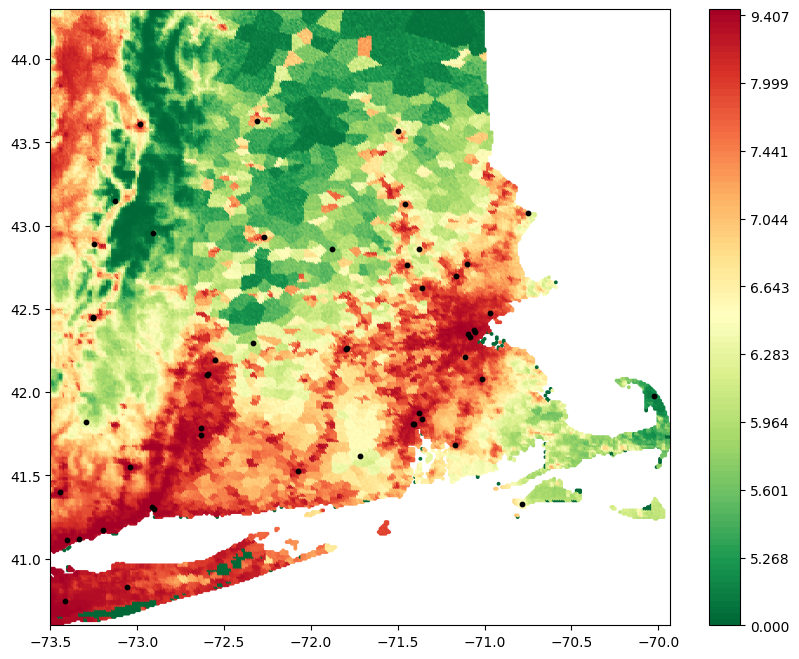

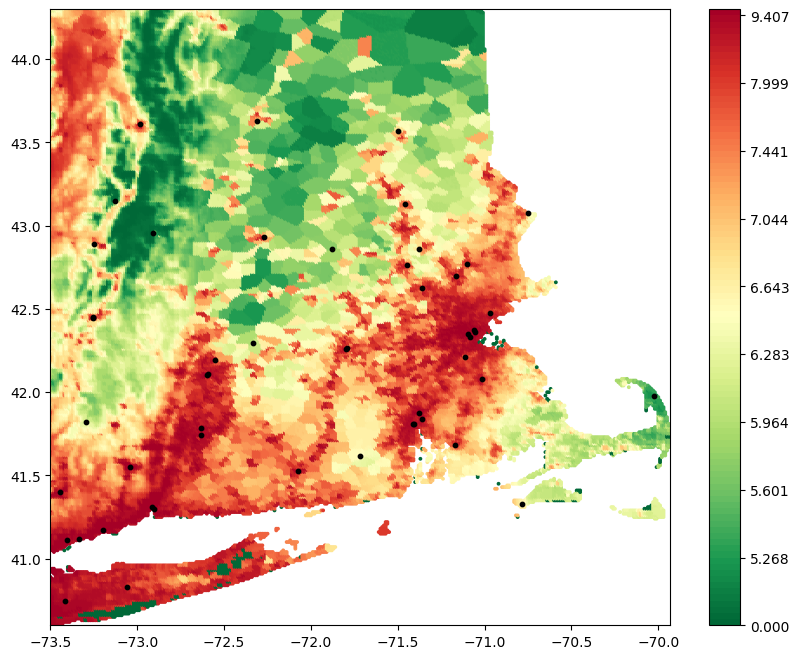

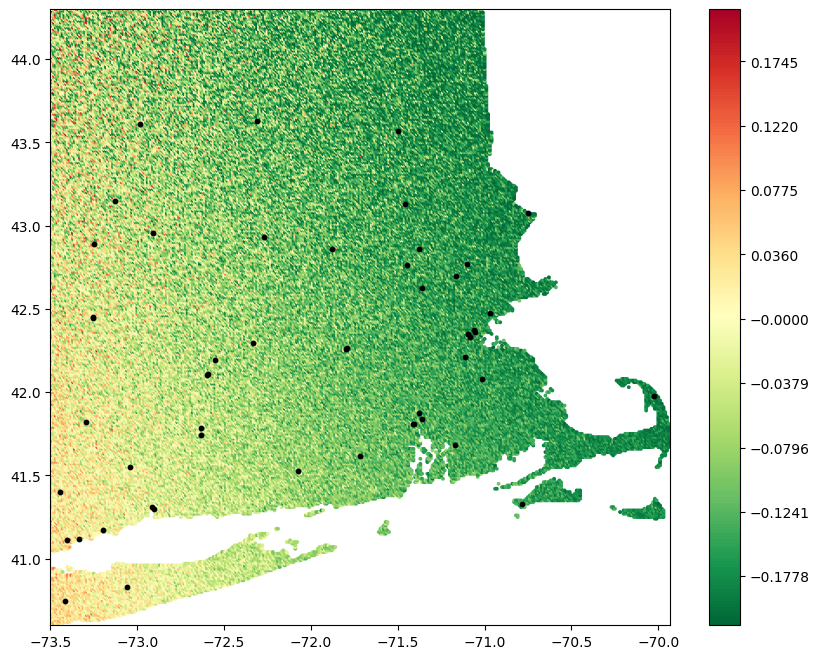

In [ ]:
# BNE vo
color_norm_pred = make_color_norm(
    #np.nan_to_num(list(surface_pred_bae.values())[:2][0]),
    list(surface_pred_bne_vo.values())[:2],  
    method="percentile")

color_norm_pred_r = make_color_norm(
    #np.nan_to_num(list(surface_pred_bae.values())[2:]),
    list(surface_pred_bne_vo.values())[2],  
    method="residual_percentile")


for name, value in surface_pred_bne_vo.items():
    save_name = os.path.join(_SAVE_ADDR_PREFIX,
                            'BNEvo_{}_bma:ls_{}_r_{}_bne:ls_{}_r_{}.png'.format(
                                name, bma_gp_lengthscale,  bma_gp_l2_regularizer,
                                bne_gp_lengthscale, bne_gp_l2_regularizer))

    value = np.where(np.isnan(value), 0, value)
    color_norm = posterior_heatmap_2d(value, X=coordinate, X_monitor=monitors,
                                                  cmap='RdYlGn_r',
                    norm= color_norm_pred_r if name=='resid' else color_norm_pred,
                                      #save_addr=save_name)
                    #norm_method="percentile",
                    save_addr='')
    

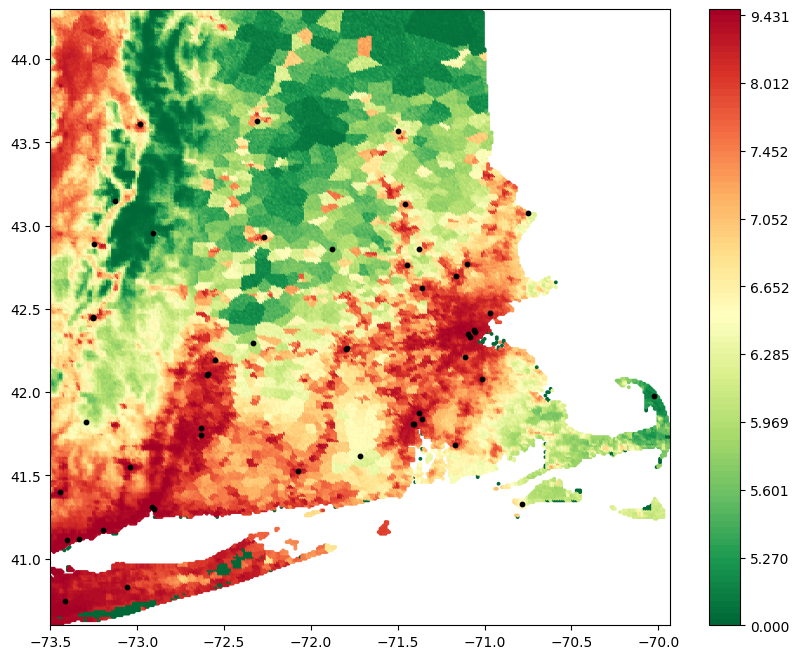

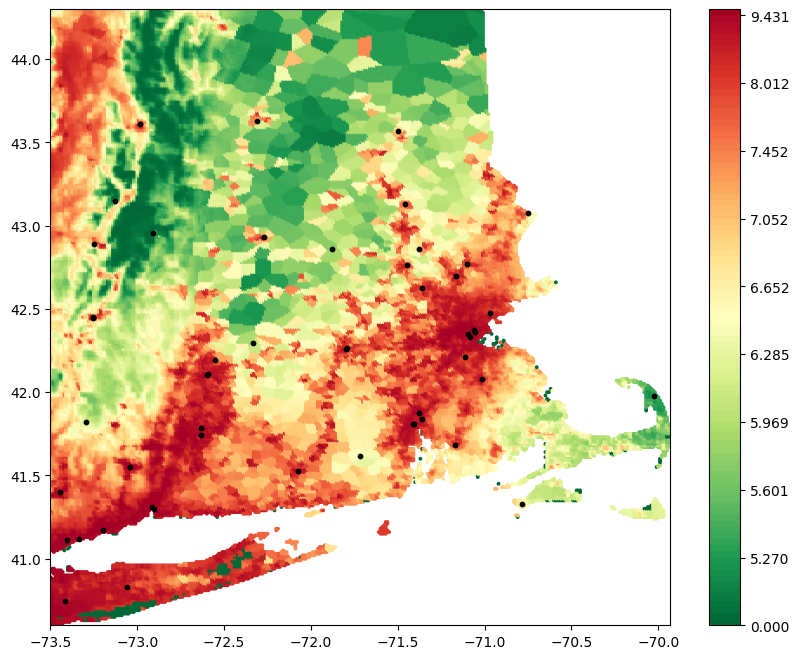

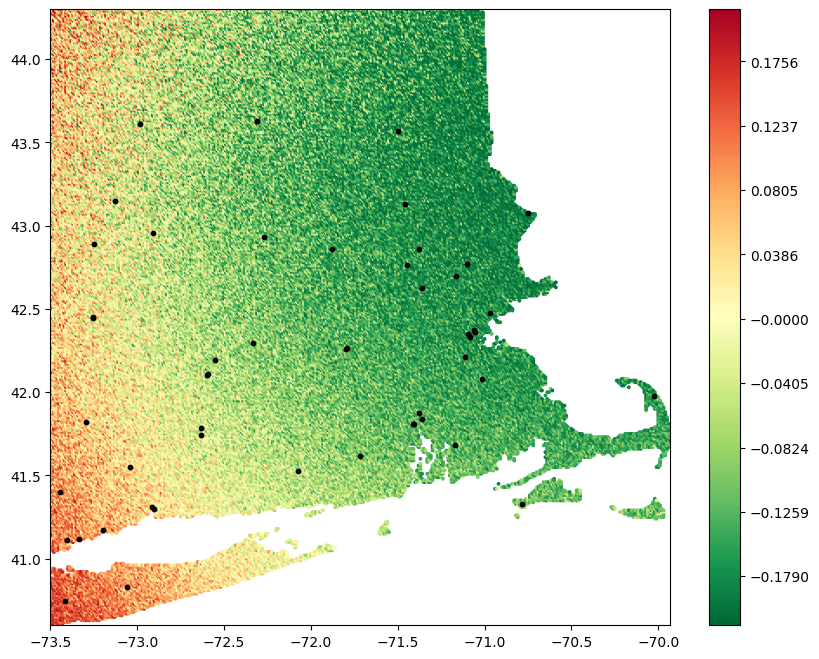

In [ ]:
# BNE v+s
color_norm_pred = make_color_norm(
    #np.nan_to_num(list(surface_pred_bae.values())[:2][0]),
    list(surface_pred_bne_vs.values())[:2],  
    method="percentile")

color_norm_pred_r = make_color_norm(
    #np.nan_to_num(list(surface_pred_bae.values())[2:]),
    list(surface_pred_bne_vs.values())[2],  
    method="residual_percentile")


for name, value in surface_pred_bne_vs.items():
    save_name = os.path.join(_SAVE_ADDR_PREFIX,
                            'BNEvs_{}_bma:ls_{}_r_{}_bne:ls_{}_r_{}.png'.format(name, bma_gp_lengthscale, 
                                bma_gp_l2_regularizer, bne_gp_lengthscale, bne_gp_l2_regularizer))

    value = np.where(np.isnan(value), 0, value)
    color_norm = posterior_heatmap_2d(value, X=coordinate, X_monitor=monitors,
                                                  cmap='RdYlGn_r',
                    norm= color_norm_pred_r if name=='resid' else color_norm_pred,
                    #norm_method="percentile",
                    save_addr='')
                #save_addr=save_name)
    

### 5.The predictive variance of Y_mean, residual process, and Y.

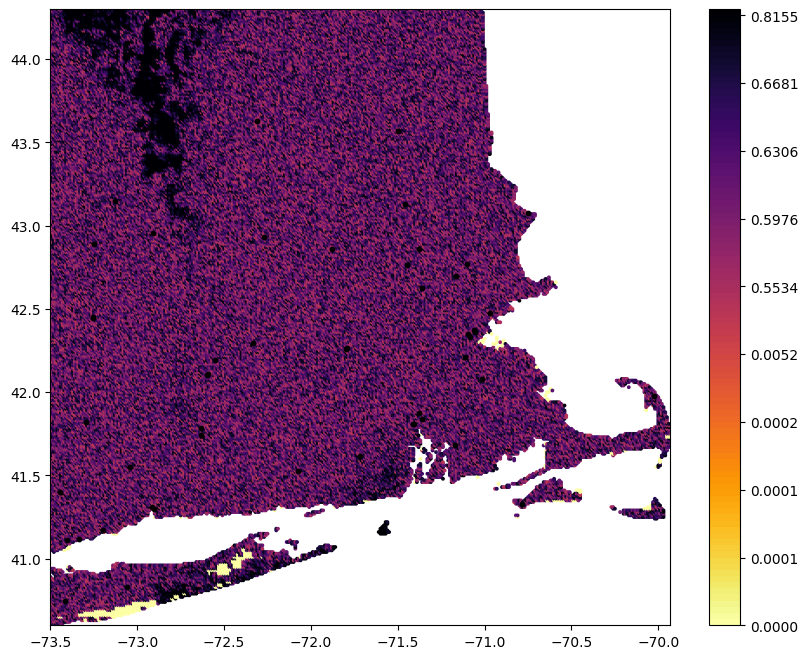

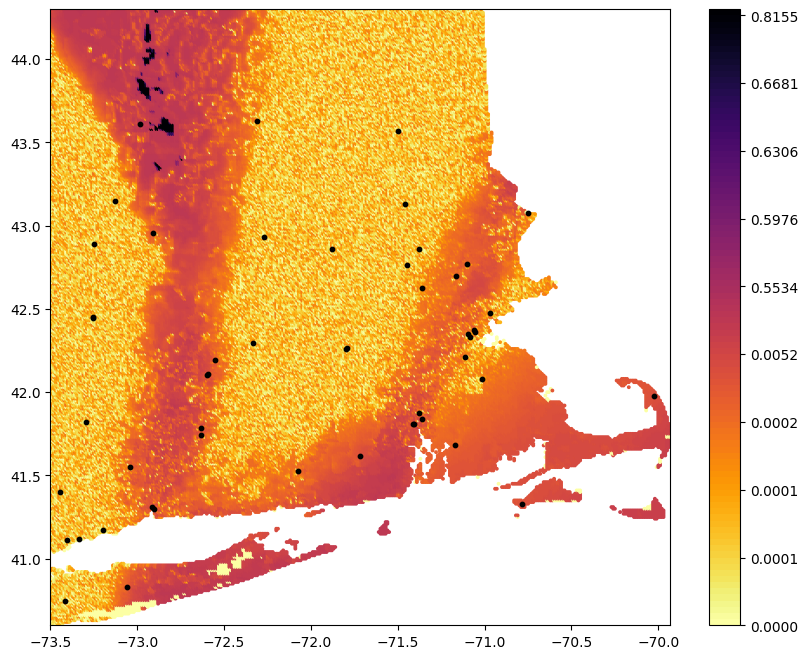

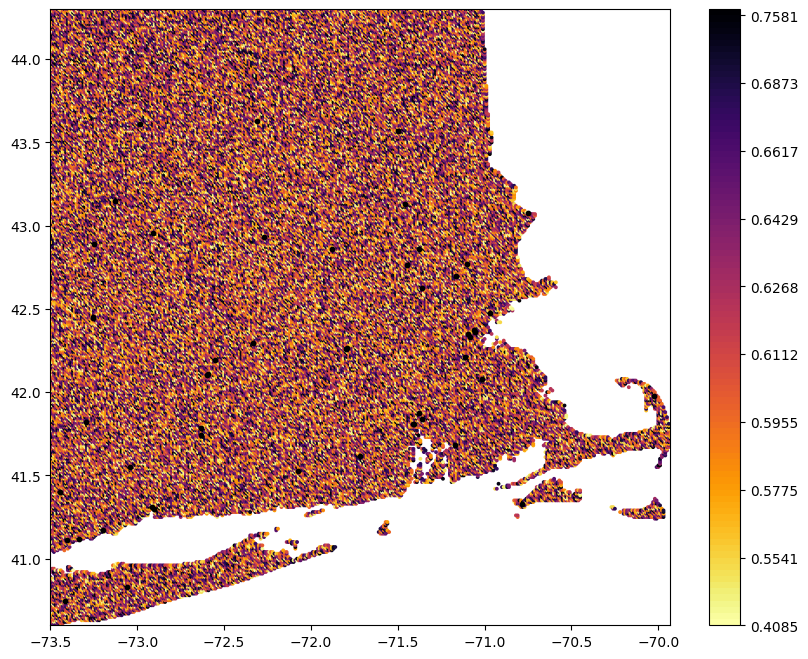

In [ ]:
# BAE
color_norm_var = make_color_norm(
    list(surface_var_bae.values())[:2], 
    method="percentile")

color_norm_var_r = make_color_norm(
    list(surface_var_bae.values())[2], 
    method="percentile")


for name, value in surface_var_bae.items():
    save_name = os.path.join(_SAVE_ADDR_PREFIX,
                            'var_BAE_{}_bma:ls_{}_r_{}_bne:ls_{}_r_{}.png'.format(
                                name, bma_gp_lengthscale,  bma_gp_l2_regularizer,
                                bne_gp_lengthscale, bne_gp_l2_regularizer))
    #value = np.where(np.isnan(value), 0, value)
    color_norm = posterior_heatmap_2d(value, X=coordinate, X_monitor=monitors,
                                cmap='inferno_r',
                                norm= color_norm_var_r if name=='resid' else color_norm_var,
                                #norm_method="percentile",
                                      save_addr='')
                                #save_addr=save_name)

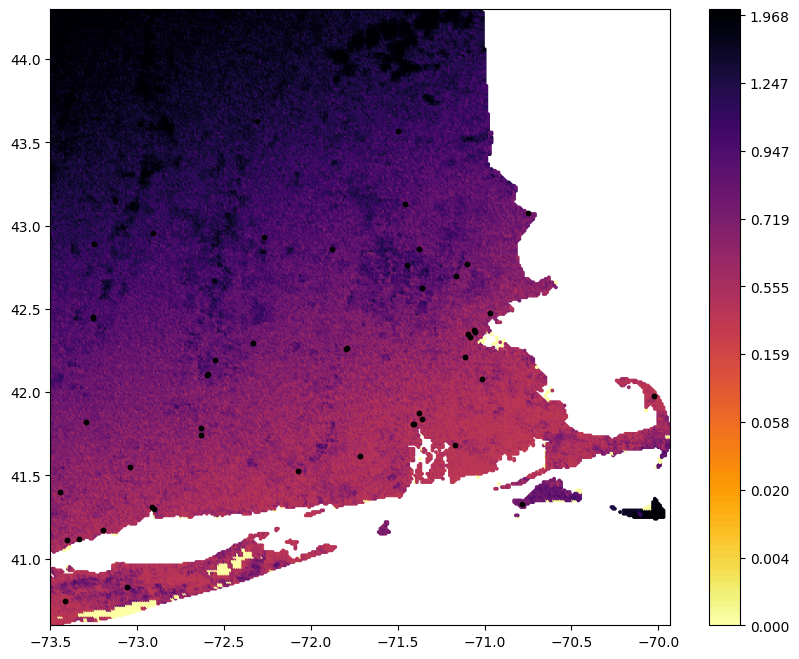

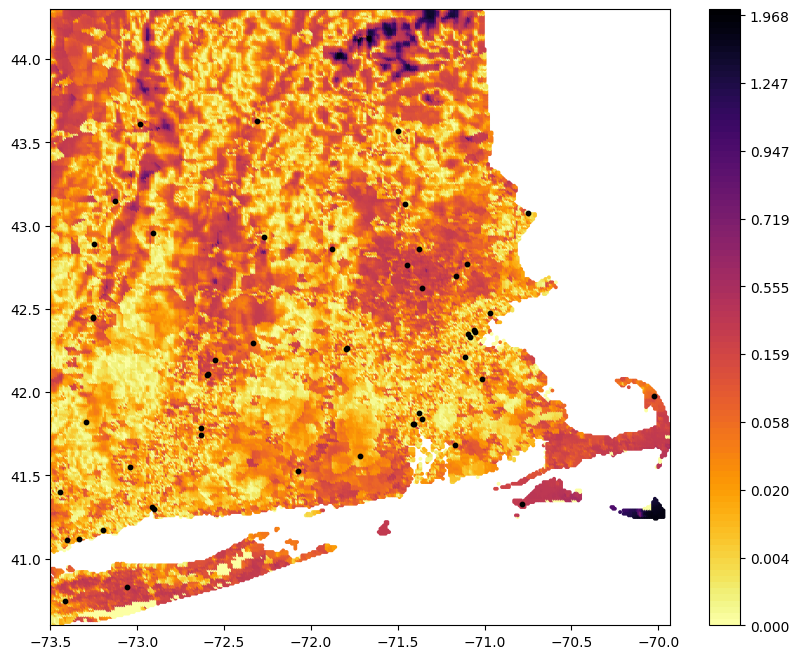

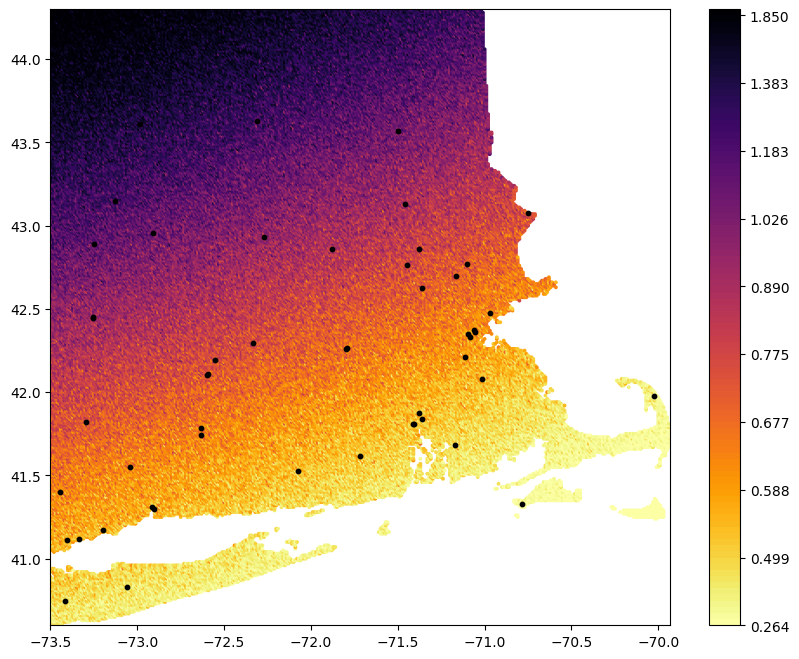

In [ ]:
# BNE vo
color_norm_var = make_color_norm(
    list(surface_var_bne_vo.values())[:2], 
    method="percentile")

color_norm_var_r = make_color_norm(
    list(surface_var_bne_vo.values())[2], 
    method="percentile")


for name, value in surface_var_bne_vo.items():
    save_name = os.path.join(_SAVE_ADDR_PREFIX,
                            'var_BNEvo_{}_bma:ls_{}_r_{}_bne:ls_{}_r_{}.png'.format(
                                name, bma_gp_lengthscale,  bma_gp_l2_regularizer,
                                bne_gp_lengthscale, bne_gp_l2_regularizer))
    #value = np.where(np.isnan(value), 0, value)
    color_norm = posterior_heatmap_2d(value, X=coordinate, X_monitor=monitors,
                                cmap='inferno_r',
                                norm= color_norm_var_r if name=='resid' else color_norm_var,
                                #norm_method="percentile",
                                save_addr='')

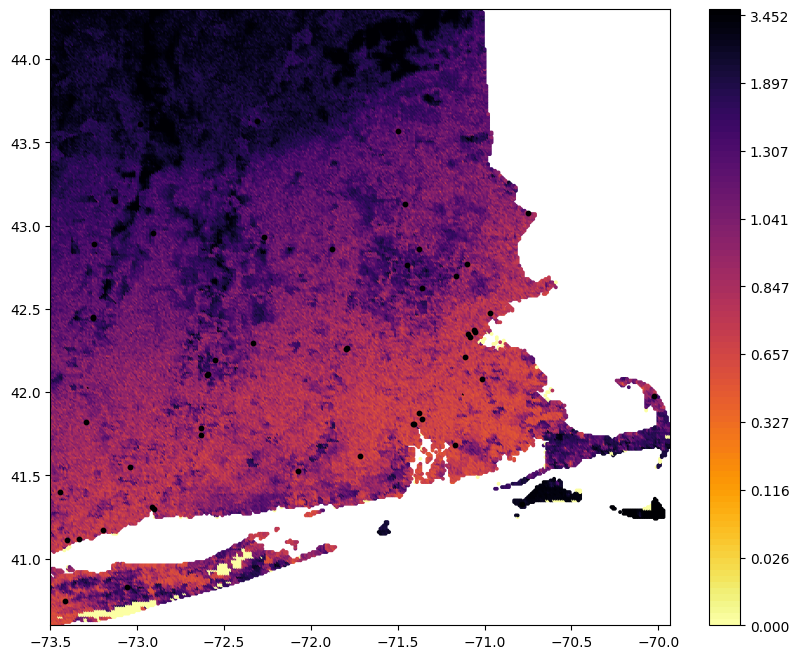

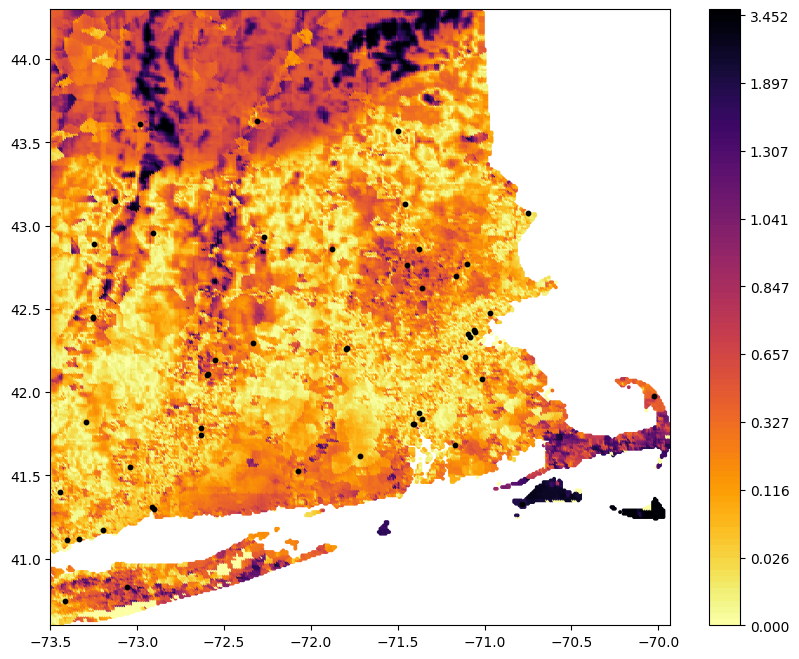

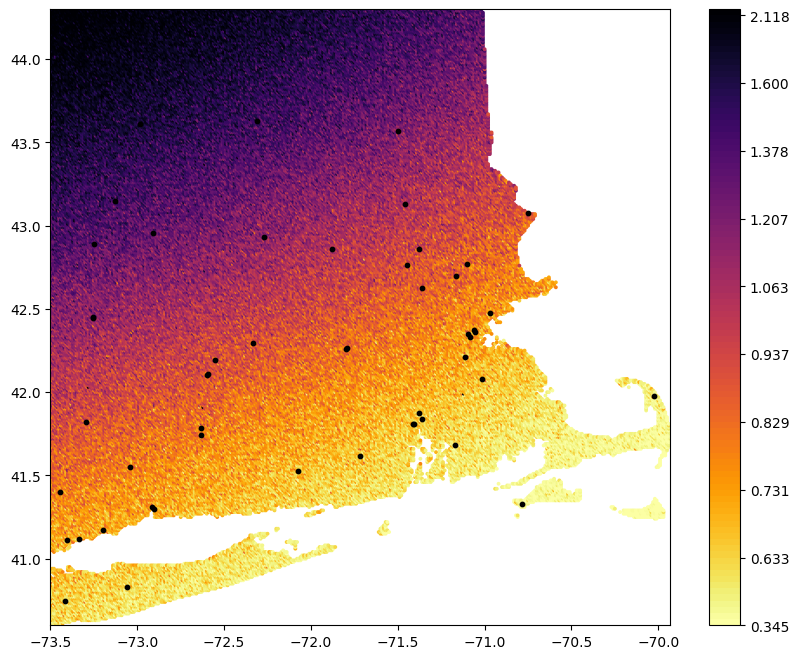

In [ ]:
# BNE v+s
color_norm_var = make_color_norm(
    list(surface_var_bne_vs.values())[:2], 
    method="percentile")

color_norm_var_r = make_color_norm(
    list(surface_var_bne_vs.values())[2], 
    method="percentile")


for name, value in surface_var_bne_vs.items():
    save_name = os.path.join(_SAVE_ADDR_PREFIX,
                            'var_BNEvs_{}_bma:ls_{}_r_{}_bne:ls_{}_r_{}.png'.format(
                                name, bma_gp_lengthscale,  bma_gp_l2_regularizer,
                                bne_gp_lengthscale, bne_gp_l2_regularizer))
    #value = np.where(np.isnan(value), 0, value)
    color_norm = posterior_heatmap_2d(value, X=coordinate, X_monitor=monitors,
                                cmap='inferno_r',
                                norm= color_norm_var_r if name=='resid' else color_norm_var,
                                #norm_method="percentile",
                                save_addr='')